In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

<h2>First look at the data 

In [13]:
df = pd.read_csv('bank.csv')
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [14]:
df.insert(0, 'ID', range(0, len(df)))
df

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11157,11157,33,blue-collar,single,primary,no,1,yes,no,cellular,20,apr,257,1,-1,0,unknown,no
11158,11158,39,services,married,secondary,no,733,no,no,unknown,16,jun,83,4,-1,0,unknown,no
11159,11159,32,technician,single,secondary,no,29,no,no,cellular,19,aug,156,2,-1,0,unknown,no
11160,11160,43,technician,married,secondary,no,0,no,yes,cellular,8,may,9,2,172,5,failure,no


In [3]:
df.shape

(11162, 17)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.0+ MB


In [5]:
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,11162.0,41.231948,11.913369,18.0,32.0,39.0,49.00,95.0
balance,11162.0,1528.538524,3225.413326,-6847.0,122.0,550.0,1708.00,81204.0
day,11162.0,15.658036,8.420740,1.0,8.0,15.0,22.00,31.0
duration,11162.0,371.993818,347.128386,2.0,138.0,255.0,496.00,3881.0
campaign,11162.0,2.508421,2.722077,1.0,1.0,2.0,3.00,63.0
pdays,11162.0,51.330407,108.758282,-1.0,-1.0,-1.0,20.75,854.0
previous,11162.0,0.832557,2.292007,0.0,0.0,0.0,1.00,58.0


----

As you can see from our data, the balance has a large standard error, and since I chose it as the target value for my regression models, I will do the following methods.

To begin with, I want to divide my data in terms of balance, the division will be the following type, values ​​that are less than zero, values ​​that are greater than 9366.

I will calculate and separate using the <code>np.percestile(value)</code> method

The meaning of this solution is for my machine learning model, since using the train_test_split method we split our data randomly, which is already bad when we have a big error among our data. 

In [7]:
df_less_zero = df[df.balance <= np.percentile(df.balance, 6.1)]
df_less_zero.count()

ID           688
age          688
job          688
marital      688
education    688
default      688
balance      688
housing      688
loan         688
contact      688
day          688
month        688
duration     688
campaign     688
pdays        688
previous     688
poutcome     688
deposit      688
dtype: int64

In [8]:
df_more = df[df.balance >= np.percentile(df.balance, 98)]
df_more.count()

ID           225
age          225
job          225
marital      225
education    225
default      225
balance      225
housing      225
loan         225
contact      225
day          225
month        225
duration     225
campaign     225
pdays        225
previous     225
poutcome     225
deposit      225
dtype: int64

In [9]:
df_middle = df[(df.balance < np.percentile(df.balance, 98)) & (df.balance > np.percentile(df.balance, 6.1))]
df_middle.count()

ID           10249
age          10249
job          10249
marital      10249
education    10249
default      10249
balance      10249
housing      10249
loan         10249
contact      10249
day          10249
month        10249
duration     10249
campaign     10249
pdays        10249
previous     10249
poutcome     10249
deposit      10249
dtype: int64

----

The 'pdays' column behaves quite strangely if we look at it with the help of the <code>DataFrame['column_name'].describe()</code> method which will allow us to better understand the column 

In [7]:
df["pdays"].describe().T

count    11162.000000
mean        51.330407
std        108.758282
min         -1.000000
25%         -1.000000
50%         -1.000000
75%         20.750000
max        854.000000
Name: pdays, dtype: float64

Next, let's apply the <code>DataFrame['column_name'].value_counts()</code> method to find out the number of duplicate values

In [8]:
df["pdays"].value_counts()

-1      8324
 92      106
 182      89
 91       84
 181      81
        ... 
 68        1
 108       1
 228       1
 268       1
 551       1
Name: pdays, Length: 472, dtype: int64

-1 this is missing data, since there is a very large number of them, we cannot consider such an option as deleting 

In [9]:
df["pdays"][df["pdays"] > 0].describe()

count    2838.000000
mean      204.818182
std       122.196901
min         1.000000
25%        98.000000
50%       182.000000
75%       286.000000
max       854.000000
Name: pdays, dtype: float64

But if we look at those data that are not missing and we can notice that the data is normal and the mean value is greater than the median, which indicates that it is distorted to the right with which standardization can help us 

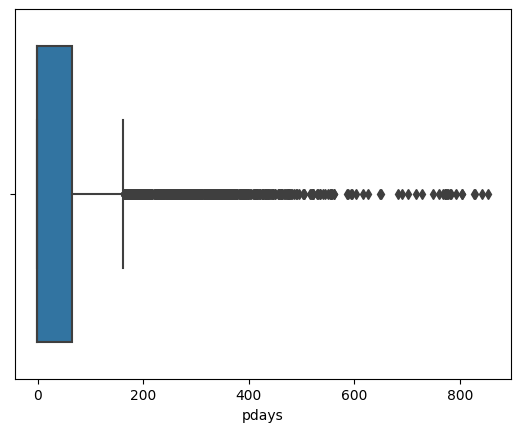

In [21]:
sns.boxplot(x=df["pdays"])
plt.show()

In [15]:
df.drop(df[df["pdays"]>600].index,inplace=True)

In [11]:
df.nunique()

age            76
job            12
marital         3
education       4
default         2
balance      3800
housing         2
loan            2
contact         3
day            31
month          12
duration     1428
campaign       36
pdays         445
previous       32
poutcome        4
deposit         2
dtype: int64

#### After function nunique() we can divide our data to categorical and numeric data

In [12]:
categorical = ['job', 'education','marital', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']
numerical = ['age', 'balance', 'day', 'duration', 'previous', 'pdays']

----

In the next cells i want create another .csv file named train and test by dividing in percents

In [16]:
train_df = df_less_zero.sample(frac=0.7, random_state=1)
common = df_less_zero.merge(train_df, on=['ID'])
test_df = df_less_zero[~df_less_zero.ID.isin(common.ID)]
train_df_md = df_middle.sample(frac=0.7, random_state=1)
common = df_middle.merge(train_df_md, on=['ID'])
test_df_md = df_middle[~df_middle.ID.isin(common.ID)]
train_df_mr = df_more.sample(frac=0.7, random_state=1)
common = df_more.merge(train_df_mr, on=['ID'])
test_df_mr = df_more[~df_more.ID.isin(common.ID)]

train = [train_df, train_df_md, train_df_mr]
test = [test_df, test_df_md, test_df_mr]

train = pd.concat(train)
test = pd.concat(test)

train.to_csv('train.csv')
test.to_csv('test.csv')

In [17]:
df.drop('ID', axis=1, inplace=True)

## Data visualization

In [13]:
df.corr(method='pearson')

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.112063,-0.000441,-0.000085,-0.005507,0.004973,0.024103
balance,0.112063,1.000000,0.010457,0.022271,-0.014061,0.020117,0.033540
day,-0.000441,0.010457,1.000000,-0.018569,0.137029,-0.079678,-0.058689
duration,-0.000085,0.022271,-0.018569,1.000000,-0.041911,-0.024541,-0.025901
campaign,-0.005507,-0.014061,0.137029,-0.041911,1.000000,-0.101737,-0.050610
pdays,0.004973,0.020117,-0.079678,-0.024541,-0.101737,1.000000,0.518492
previous,0.024103,0.033540,-0.058689,-0.025901,-0.050610,0.518492,1.000000


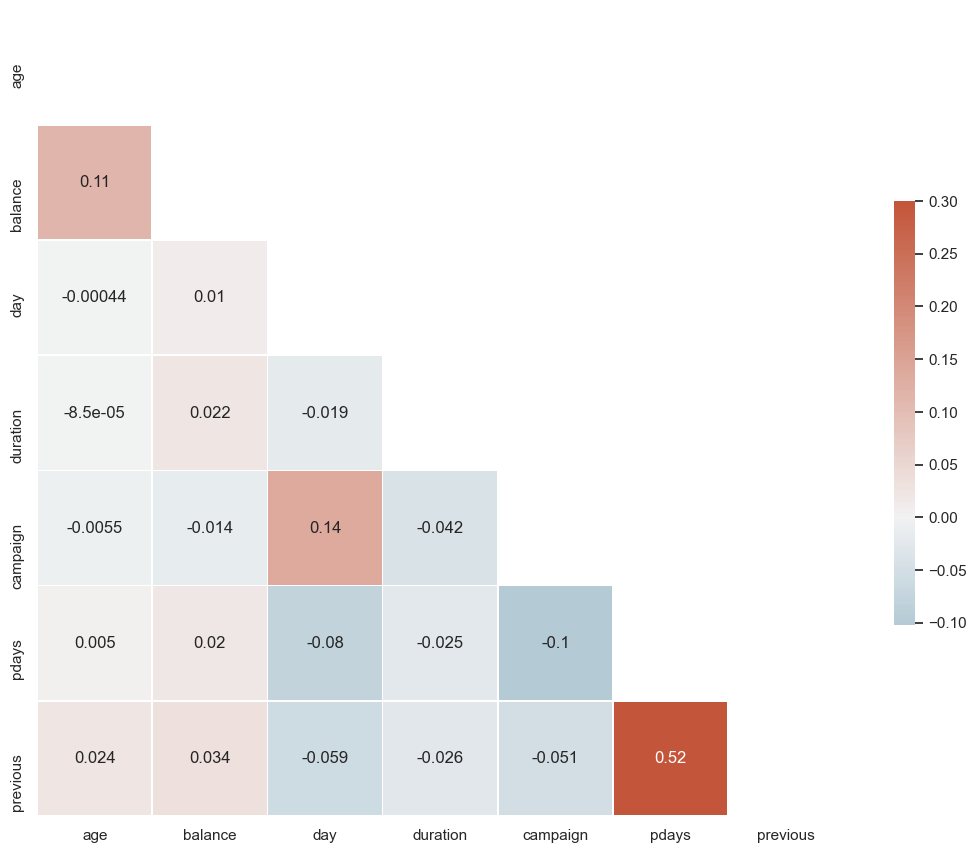

In [14]:
sns.set_theme(style="white")
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(13, 11))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr,annot=True, mask=mask, cmap=cmap, vmax=0.3, center=0, fmt=".2g",
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

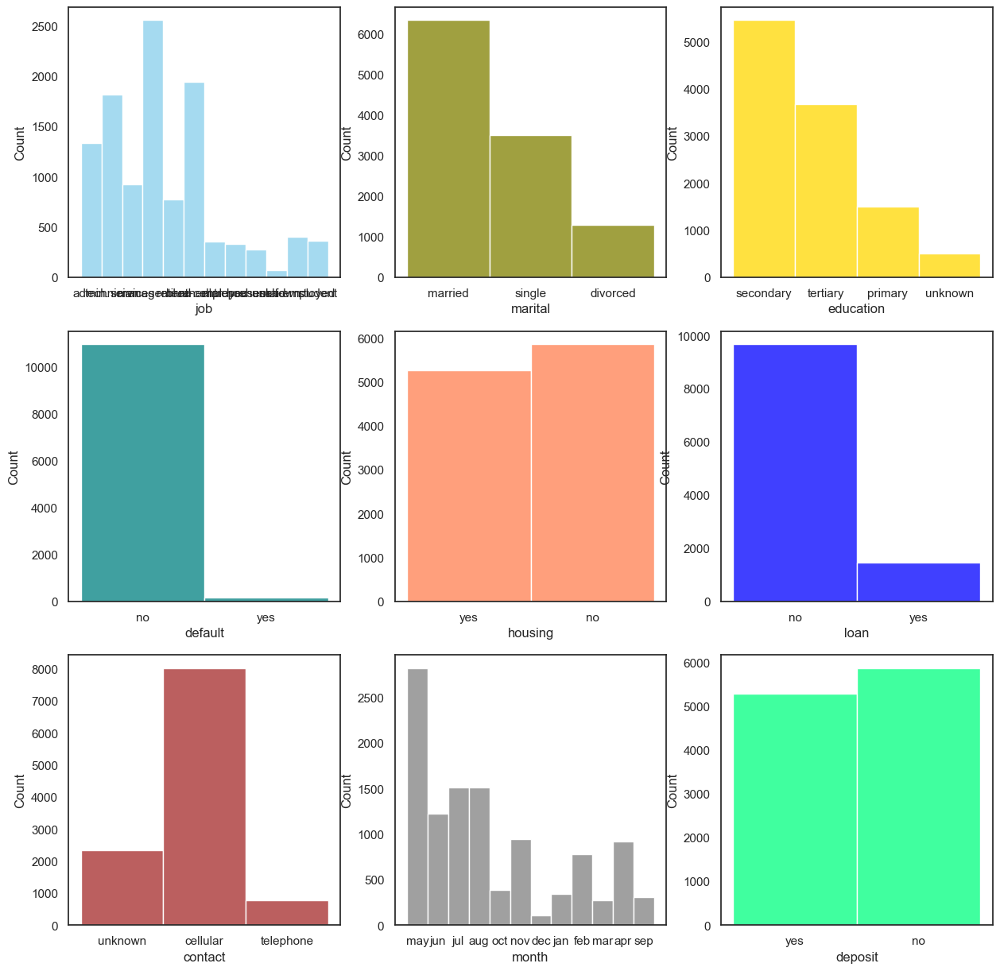

In [15]:
fig, axs = plt.subplots(3, 3, figsize=(15, 15))
sns.histplot(data=df, x="job", color="skyblue", ax=axs[0, 0])
sns.histplot(data=df, x="marital", color="olive", ax=axs[0, 1])
sns.histplot(data=df, x="education", color="gold", ax=axs[0, 2])
sns.histplot(data=df, x="default", color="teal", ax=axs[1, 0])
sns.histplot(data=df, x="housing", color="coral", ax=axs[1, 1])
sns.histplot(data=df, x="loan", color="blue", ax=axs[1, 2])
sns.histplot(data=df, x="contact", color="brown", ax=axs[2, 0])
sns.histplot(data=df, x="month", color="gray", ax=axs[2, 1])
sns.histplot(data=df, x="deposit", color="springgreen", ax=axs[2, 2])
plt.show()

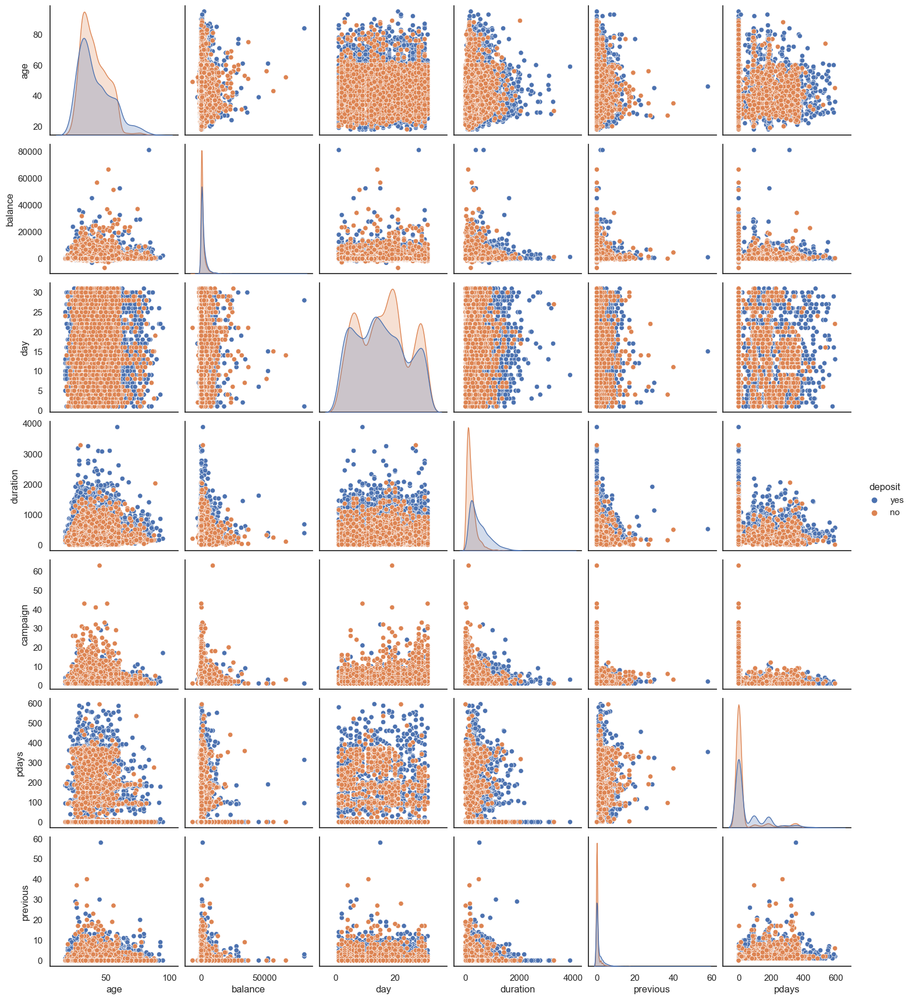

In [16]:
sns.pairplot(data=df, x_vars=numerical, hue='deposit')
plt.show()

## Encoding categorical data

In [25]:
df.replace({'deposit': {"yes": 1,'no':0}},inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10196 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        10196 non-null  int64 
 1   job        10196 non-null  object
 2   marital    10196 non-null  object
 3   education  10196 non-null  object
 4   default    10196 non-null  object
 5   balance    10196 non-null  int64 
 6   housing    10196 non-null  object
 7   loan       10196 non-null  object
 8   contact    10196 non-null  object
 9   day        10196 non-null  int64 
 10  month      10196 non-null  object
 11  duration   10196 non-null  int64 
 12  campaign   10196 non-null  int64 
 13  pdays      10196 non-null  int64 
 14  previous   10196 non-null  int64 
 15  poutcome   10196 non-null  object
 16  deposit    10196 non-null  int64 
dtypes: int64(8), object(9)
memory usage: 1.1+ MB


In [26]:
df = pd.get_dummies(df, columns=categorical)
df.head()

,age,balance,day,duration,campaign,pdays,previous,deposit,job_admin.,job_blue-collar,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,59,2343,5,1042,1,-1,0,1,1,0,...,0,0,1,0,0,0,0,0,0,1
1,56,45,5,1467,1,-1,0,1,1,0,...,0,0,1,0,0,0,0,0,0,1
2,41,1270,5,1389,1,-1,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
3,55,2476,5,579,1,-1,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
4,54,184,5,673,2,-1,0,1,1,0,...,0,0,1,0,0,0,0,0,0,1


In [27]:
df.columns

Index(['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous',
       'deposit', 'job_admin.', 'job_blue-collar', 'job_entrepreneur',
       'job_housemaid', 'job_management', 'job_retired', 'job_self-employed',
       'job_services', 'job_student', 'job_technician', 'job_unemployed',
       'job_unknown', 'education_primary', 'education_secondary',
       'education_tertiary', 'education_unknown', 'marital_divorced',
       'marital_married', 'marital_single', 'default_no', 'default_yes',
       'housing_no', 'housing_yes', 'loan_no', 'loan_yes', 'contact_cellular',
       'contact_telephone', 'contact_unknown', 'month_apr', 'month_aug',
       'month_dec', 'month_feb', 'month_jan', 'month_jul', 'month_jun',
       'month_mar', 'month_may', 'month_nov', 'month_oct', 'month_sep',
       'poutcome_failure', 'poutcome_other', 'poutcome_success',
       'poutcome_unknown'],
      dtype='object')

## Machine Learning for Classification

In [49]:
from sklearn.model_selection import train_test_split

In [50]:
from sklearn.metrics import classification_report, confusion_matrix

In [51]:
X=df.drop('deposit',axis=1)
y=df['deposit']

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2)

### Scaling data

In [53]:
from sklearn.preprocessing import StandardScaler

In [54]:
scl=StandardScaler()

In [55]:
scaler_train=scl.fit(X_train)
scaler_test=scl.fit(X_test)

In [56]:
X_train=scaler_train.transform(X_train)
X_test=scaler_test.transform(X_test)

In [57]:
X_train

array([[ 1.03222092, -0.27383865,  0.51721193, ..., -0.22787216,
        -0.34714957,  0.59509579],
       [-0.52153729,  2.21696478,  0.28165006, ..., -0.22787216,
        -0.34714957, -1.68040174],
       [ 1.11399767, -0.37005774,  1.4594594 , ..., -0.22787216,
        -0.34714957,  0.59509579],
       ...,
       [ 0.70511393, -0.5001653 , -1.36728302, ..., -0.22787216,
        -0.34714957,  0.59509579],
       [ 1.27755117,  3.4012462 ,  0.87055473, ..., -0.22787216,
        -0.34714957, -1.68040174],
       [-0.84864429, -0.77429892, -0.42503554, ..., -0.22787216,
        -0.34714957,  0.59509579]])

## Machine Learning for Regression

In [182]:
from sklearn.model_selection import train_test_split

In [183]:
from sklearn.metrics import mean_squared_error, r2_score

In [184]:
X=df.drop('balance',axis=1)
y=df['balance']

In [185]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

### Scaling data

In [186]:
scl=StandardScaler()

In [187]:
scaler_train=scl.fit(X_train)
scaler_test=scl.fit(X_test)

In [188]:
X_train=scaler_train.transform(X_train)
X_test=scaler_test.transform(X_test)

In [189]:
X_train

array([[-3.62235274e-01,  5.20756507e-01, -9.29502323e-01, ...,
        -2.36148091e-01, -3.28054995e-01,  6.17178662e-01],
       [-8.65356529e-01,  1.34848446e+00, -2.33523187e-01, ...,
        -2.36148091e-01, -3.28054995e-01,  6.17178662e-01],
       [-8.65356529e-01, -1.13469940e+00, -1.59796583e-01, ...,
        -2.36148091e-01, -3.28054995e-01,  6.17178662e-01],
       ...,
       [-7.81502987e-01,  5.20756507e-01,  3.34369161e+00, ...,
        -2.36148091e-01, -3.28054995e-01,  6.17178662e-01],
       [ 8.95567864e-01,  7.57250208e-01,  1.94583521e+00, ...,
        -2.36148091e-01, -3.28054995e-01,  6.17178662e-01],
       [-1.11691716e+00, -1.13469940e+00, -5.47120148e-04, ...,
        -2.36148091e-01, -3.28054995e-01,  6.17178662e-01]])

### KNeighbors

In [157]:
from sklearn.neighbors import KNeighborsClassifier

In [158]:
knn = KNeighborsClassifier()

In [159]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [160]:
y_preds = knn.predict(X_test)

In [161]:
target_names = ['yes', 'no']

In [162]:
from sklearn.metrics import classification_report, confusion_matrix

In [163]:
print(confusion_matrix(y_test, y_preds))

[[1290  286]
 [ 460 1031]]


In [164]:
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.74      0.82      0.78      1576
          no       0.78      0.69      0.73      1491

    accuracy                           0.76      3067
   macro avg       0.76      0.76      0.76      3067
weighted avg       0.76      0.76      0.76      3067



#### As we can see, our data coped quite well when saving the default data, then we will try to change the parameters 

In [165]:
knn = KNeighborsClassifier(n_neighbors=7)

In [166]:
knn.fit(X_train, y_train)
y_preds = knn.predict(X_test)
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.73      0.83      0.78      1576
          no       0.79      0.67      0.73      1491

    accuracy                           0.75      3067
   macro avg       0.76      0.75      0.75      3067
weighted avg       0.76      0.75      0.75      3067



#### Our model improved with an increase in the number of neighbors, the accuracy of prediction increased and how much he correctly learned among the rest ...

In [167]:
knn = KNeighborsClassifier(n_neighbors=11)
knn.fit(X_train, y_train)
y_preds = knn.predict(X_test)
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.71      0.83      0.77      1576
          no       0.79      0.65      0.71      1491

    accuracy                           0.74      3067
   macro avg       0.75      0.74      0.74      3067
weighted avg       0.75      0.74      0.74      3067



#### The model was not improved so, he only changed the principle, he started to predict those who have a deposit and not those who do not, which means increasing the number of neighbors further on whether we can get a better model

In [168]:
knn = KNeighborsClassifier(n_neighbors=7, weights='distance')
knn.fit(X_train, y_train)
y_preds = knn.predict(X_test)
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.73      0.83      0.78      1576
          no       0.79      0.68      0.73      1491

    accuracy                           0.76      3067
   macro avg       0.76      0.76      0.76      3067
weighted avg       0.76      0.76      0.76      3067



#### The model did not become better considering the distance more precisely so that the model distinguishes the class by distance, considering the weight by percentage, it is still better 

In [207]:
from sklearn.neighbors import KNeighborsRegressor

In [208]:
from sklearn.metrics import mean_squared_error, r2_score

In [32]:
X=df.drop('balance',axis=1)
y=df['balance']

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [209]:
knn = KNeighborsRegressor()

In [210]:
knn.fit(X_train, y_train)
y_preds = knn.predict(X_test)

In [211]:
mse =mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = r2_score(y_test, y_preds)
print("R2 score:", rmse)

Mean Squared Error: 8514158.743599873
R2 score: -0.14846963004050817


In [212]:
knn = KNeighborsRegressor(n_neighbors=7, weights='distance')

In [213]:
mse =mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = r2_score(y_test, y_preds)
print("R2 score:", rmse)

Mean Squared Error: 8514158.743599873
Root Mean Squared Error: -0.14846963004050817


In [214]:
knn = KNeighborsRegressor(n_neighbors=7)

In [215]:
knn.fit(X_train, y_train)
y_preds = knn.predict(X_test)
mse =mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = r2_score(y_test, y_preds)
print("R2 score:", rmse)

Mean Squared Error: 8079177.566682487
R2 score: -0.08979528694061933


#### The situation is very similar to classification, the model understands best when the weight of the data does not depend on distance and it is best to leave them equal, plus as the number of neighbors increases, it understands better 

### Support Vector Machines

In [169]:
from sklearn.svm import SVC, SVR

In [170]:
svc = SVC()

In [171]:
svc.fit(X_train, y_train)

SVC()

In [172]:
y_preds = svc.predict(X_test)

In [173]:
from sklearn.metrics import classification_report, confusion_matrix

In [174]:
print(confusion_matrix(y_test, y_preds))

[[1321  255]
 [ 237 1254]]


In [175]:
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.85      0.84      0.84      1576
          no       0.83      0.84      0.84      1491

    accuracy                           0.84      3067
   macro avg       0.84      0.84      0.84      3067
weighted avg       0.84      0.84      0.84      3067



#### With default parameters, our data learned quite normally, the only problem is that our model began to better distinguish between representatives who have a deposit, which is not entirely correct

In [176]:
svc = SVC(kernel='poly')

In [177]:
svc.fit(X_train, y_train)

SVC(kernel='poly')

In [178]:
y_preds = svc.predict(X_test)
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.82      0.85      0.83      1576
          no       0.84      0.80      0.82      1491

    accuracy                           0.83      3067
   macro avg       0.83      0.83      0.83      3067
weighted avg       0.83      0.83      0.83      3067



#### Since although he predicted those who have a deposit of 98 percent, but among all the data on how much he correctly guessed, 56 percent will be not entirely pleasant news, but despite the fact that he guessed only 15 percent, they turned out to be 86 percent correct, which cannot please . This method was applied to check how the model will behave.

But there is a big but to build a better model, I will continue to use the kernel = 'RBF' method since our data is located between other data and using a three-dimensional distribution they will better understand 

In [179]:
svc = SVC(gamma='scale', decision_function_shape='ovr', class_weight='balanced')

In [180]:
svc.fit(X_train, y_train)

SVC(class_weight='balanced')

In [181]:
y_preds = svc.predict(X_test)
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.85      0.83      0.84      1576
          no       0.82      0.85      0.84      1491

    accuracy                           0.84      3067
   macro avg       0.84      0.84      0.84      3067
weighted avg       0.84      0.84      0.84      3067



#### By balancing the weight of our data, our data will be more correctly determined by the model that you can see, the model has become better able to distinguish between those who did not have a deposit, while those who have it, although they became worse by 3 percent, but at the same time, by 71 percent, he accurately found correctly from all data of this class 

### SVR

In [200]:
svr = SVR()

In [201]:
svr.fit(X_train, y_train)

SVR()

In [202]:
y_preds = svr.predict(X_test)
score=svr.score(X_test, y_test)
print(score)
 
mse = mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

-0.15732321716823705
Mean Squared Error: 3318790.560098869
Root Mean Squared Error: 1821.7548024086198


In [203]:
svr = SVR(kernel='poly')

In [204]:
svr.fit(X_train, y_train)

SVR(kernel='poly')

In [205]:
y_preds = svr.predict(X_test)
score=svr.score(X_test, y_test)
print(score)
 
mse = mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

-0.1567355508225592
Mean Squared Error: 3317105.3424417865
Root Mean Squared Error: 1821.2922177513926


#### Not very noticeable changes, but if you look closely, there are only more errors 

In [206]:
svr = SVR(shrinking=False, verbose=True)

In [207]:
svr.fit(X_train, y_train)

[LibSVM]

SVR(shrinking=False, verbose=True)

In [208]:
y_preds = svr.predict(X_test)
score=svr.score(X_test, y_test)
print(score)
 
mse = mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

-0.15732321716823705
Mean Squared Error: 3318790.560098869
Root Mean Squared Error: 1821.7548024086198


### As can be seen from the attempts to change the parameters, the default parameters did the best job for this model. 

### Decision Tree

In [32]:
features = df[['age', 'balance', 'day', 'duration', 'campaign', 'previous',
       'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'education_primary', 'education_secondary', 'education_tertiary',
       'education_unknown', 'marital_divorced', 'marital_married',
       'marital_single', 'default_no', 'default_yes', 'housing_no',
       'housing_yes', 'loan_no', 'loan_yes', 'contact_cellular',
       'contact_telephone', 'contact_unknown', 'month_apr', 'month_aug',
       'month_dec', 'month_feb', 'month_jan', 'month_jul', 'month_jun',
       'month_mar', 'month_may', 'month_nov', 'month_oct', 'month_sep',
       'poutcome_failure', 'poutcome_other', 'poutcome_success',
       'poutcome_unknown']]

In [33]:
features_name = ['age', 'balance', 'day', 'duration', 'campaign', 'previous',
       'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'education_primary', 'education_secondary', 'education_tertiary',
       'education_unknown', 'marital_divorced', 'marital_married',
       'marital_single', 'default_no', 'default_yes', 'housing_no',
       'housing_yes', 'loan_no', 'loan_yes', 'contact_cellular',
       'contact_telephone', 'contact_unknown', 'month_apr', 'month_aug',
       'month_dec', 'month_feb', 'month_jan', 'month_jul', 'month_jun',
       'month_mar', 'month_may', 'month_nov', 'month_oct', 'month_sep',
       'poutcome_failure', 'poutcome_other', 'poutcome_success',
       'poutcome_unknown']

In [34]:
target = df.deposit

### Decision Tree Classifier

In [109]:
from sklearn.tree import DecisionTreeClassifier

In [110]:
from sklearn.tree import plot_tree

In [111]:
tree = DecisionTreeClassifier()

In [112]:
tree.fit(X_train, y_train)

DecisionTreeClassifier()

In [113]:
y_preds = tree.predict(X_test)
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.79      0.81      0.80      1576
          no       0.80      0.77      0.78      1491

    accuracy                           0.79      3067
   macro avg       0.79      0.79      0.79      3067
weighted avg       0.79      0.79      0.79      3067



<Figure size 4000x3000 with 0 Axes>

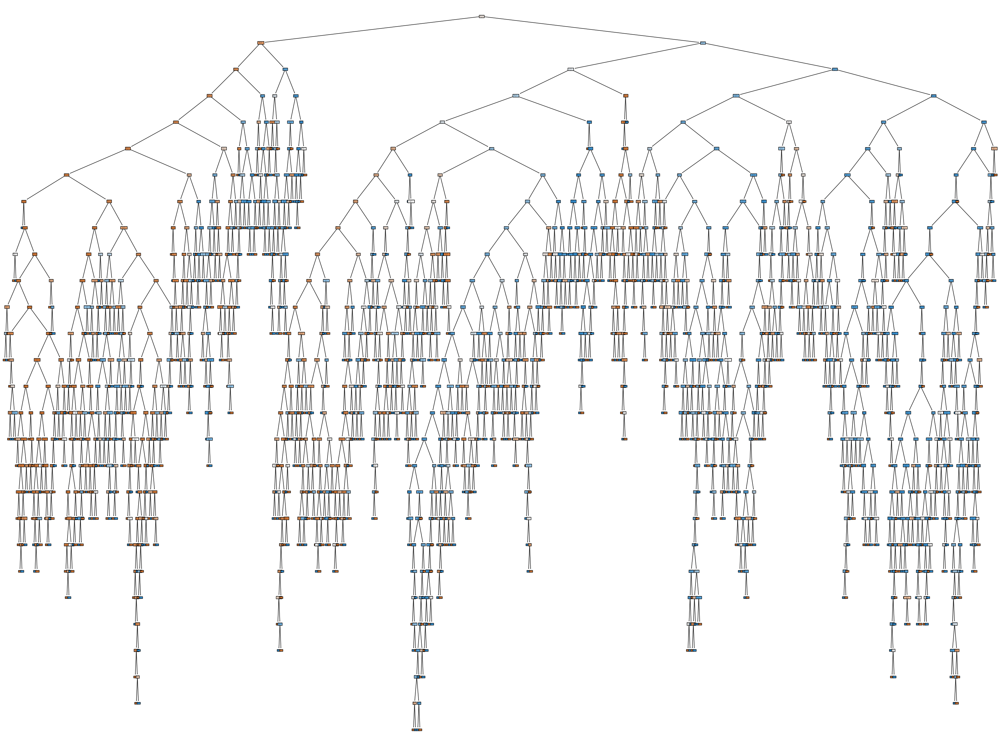

In [35]:
fig = plt.figure(figsize=(40,30))
_ = plot_tree(tree,
                   feature_names=features.columns,
                   class_names=target.astype(str),
                   filled=True)
plt.show()

In [114]:
tree = DecisionTreeClassifier(max_depth=19)

In [115]:
tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=19)

In [116]:
y_preds = tree.predict(X_test)
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.80      0.80      0.80      1576
          no       0.79      0.78      0.79      1491

    accuracy                           0.79      3067
   macro avg       0.79      0.79      0.79      3067
weighted avg       0.79      0.79      0.79      3067



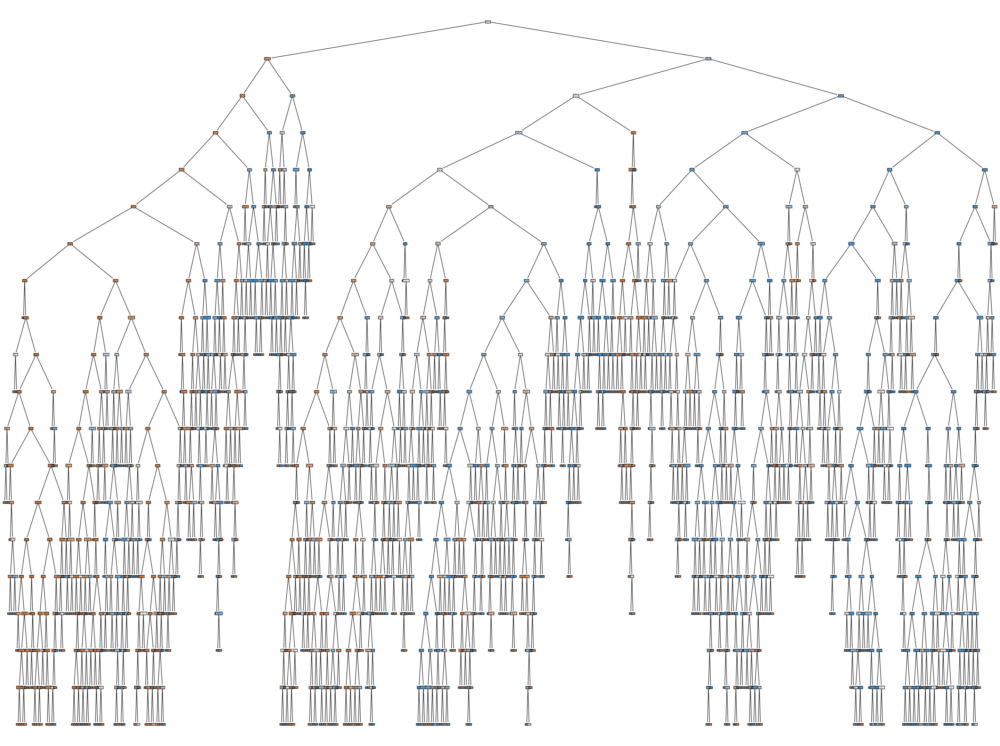

In [55]:
fig = plt.figure(figsize=(40,30))
_ = plot_tree(tree,
                   feature_names=features.columns,
                   class_names=target.astype(str),
                   filled=True)
plt.show()

In [123]:
tree = DecisionTreeClassifier(max_depth=19, min_samples_split=5)

In [124]:
tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=19, min_samples_split=5)

In [125]:
y_preds = tree.predict(X_test)
target_names = ['yes', 'no']
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.79      0.81      0.80      1576
          no       0.80      0.77      0.78      1491

    accuracy                           0.79      3067
   macro avg       0.79      0.79      0.79      3067
weighted avg       0.79      0.79      0.79      3067



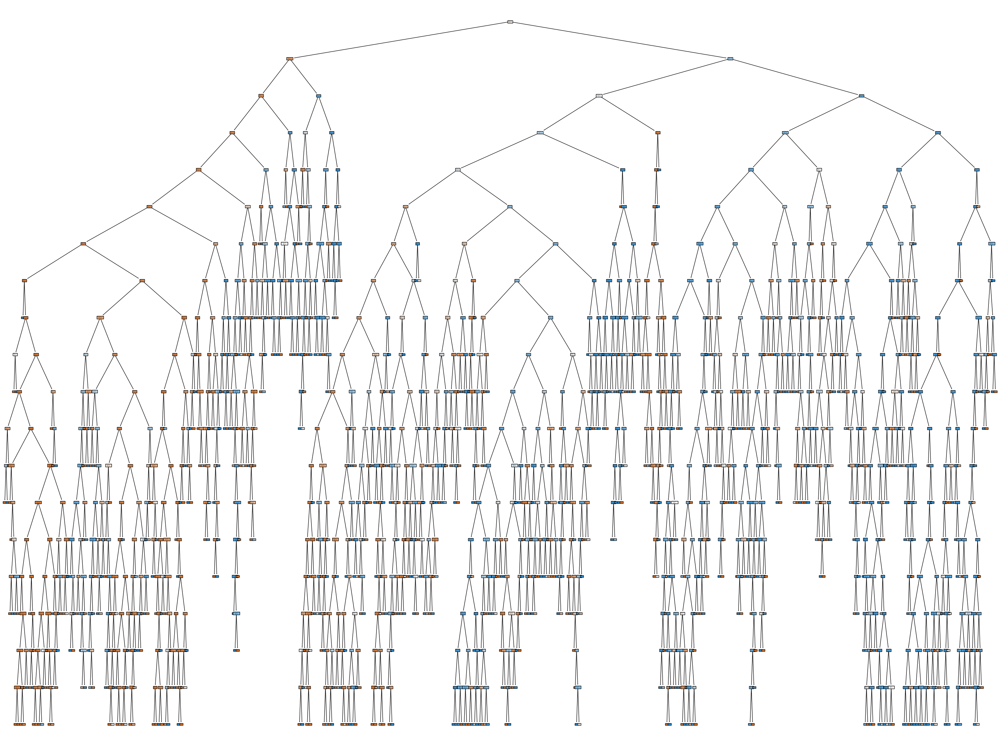

In [67]:
fig = plt.figure(figsize=(40,30))
_ = plot_tree(tree,
                   feature_names=features.columns,
                   class_names=target.astype(str),
                   filled=True)
plt.show()

### Decision Tree Regressor

In [134]:
from sklearn.tree import DecisionTreeRegressor

In [135]:
tree = DecisionTreeRegressor()

In [136]:
tree.fit(X_train, y_train)

DecisionTreeRegressor()

In [137]:
y_preds = tree.predict(X_test)
score=r2_score(y_test, y_preds)
print(score)
 
mse = mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

-1.116356330611021
Mean Squared Error: 6068955.765895012
Root Mean Squared Error: 2463.5250690616103


In [138]:
for criterion in ['friedman_mse','poisson']:
    for splitter in ['best', 'random']:        
        dt = DecisionTreeRegressor(criterion=criterion, splitter=splitter,random_state=1)
        dt.fit(X_train, y_train)
        y_predicted = dt.predict(X_test)
        print(f'criterion-{criterion} splitter-{splitter}  R2_score:{r2_score(y_test,y_predicted)}')

criterion-friedman_mse splitter-best  R2_score:-1.1058418310988203
criterion-friedman_mse splitter-random  R2_score:-1.0027563650474076
criterion-poisson splitter-best  R2_score:-1.0786861738153166
criterion-poisson splitter-random  R2_score:-1.083603225945453


In [139]:
tree = DecisionTreeRegressor(splitter='random')

In [140]:
tree.fit(X_train, y_train)

DecisionTreeRegressor(splitter='random')

In [141]:
y_preds = tree.predict(X_test)
score=r2_score(y_test, y_preds)
print(score)
 
mse = mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

-1.0882717662373769
Mean Squared Error: 5988419.243560483
Root Mean Squared Error: 2447.124689009631


In [142]:
tree = DecisionTreeRegressor(splitter='best', max_depth=3)

In [143]:
tree.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3)

In [144]:
y_preds = tree.predict(X_test)
score=r2_score(y_test, y_preds)
print(score)
 
mse = mean_squared_error(y_test, y_preds)
print("Mean Squared Error:",mse)
 
rmse = np.sqrt(mse)
print("Root Mean Squared Error:", rmse)

0.03638891831315927
Mean Squared Error: 2763293.1873033172
Root Mean Squared Error: 1662.3156100161357


### Logistic Regression

In [32]:
from sklearn.linear_model import LogisticRegression

In [48]:
lgr = LogisticRegression()

#### Hyper Parameter tuning

In [45]:
for_C_param = np.arange(1, 8, 0.3)
for_C_param = for_C_param.tolist()
print(for_C_param)

[1.0, 1.3, 1.6, 1.9000000000000001, 2.2, 2.5, 2.8000000000000003, 3.1000000000000005, 3.4000000000000004, 3.7, 4.0, 4.300000000000001, 4.6000000000000005, 4.9, 5.200000000000001, 5.500000000000001, 5.800000000000001, 6.1000000000000005, 6.4, 6.700000000000001, 7.000000000000001, 7.300000000000001, 7.600000000000001, 7.900000000000001]


In [51]:
parameters={"penalty":["l1","l2", "elasticnet"],
            "dual" : [True, False],
           "fit_intercept":[True, False],
           "C": for_C_param,
           "solver":["newton-cg","lbfgs","liblinear", "sag", "saga"]
           }

In [47]:
from sklearn.model_selection import GridSearchCV

In [52]:
tuning_model=GridSearchCV(lgr, param_grid=parameters, scoring='accuracy', cv=5)

In [53]:
tuning_model.fit(X_train,y_train)

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got l1 penalty.

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet pena

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver newton-cg supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. T

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elasticnet 

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver newton-cg supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. T

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elasticnet 

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver newton-cg supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. T

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elasticnet 

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elasticnet 

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elasticnet 

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver newton-cg supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. T

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver newton-cg supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. T

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elasticnet 

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver newton-cg supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. T

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver sag supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sco

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver newton-cg supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. T

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver lbfgs supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The s

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver saga supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. The sc

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 446, in _check_solver
    raise ValueError("Solver %s supports only "
ValueError: Solver newton-cg supports only dual=False, got dual=True

  warnings.warn("Estimator fit failed. T

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\adilbek

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver sag supports only 'l2' or 'none' penalties, got l1 penalty.

  wa

c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [1.0, 1.3, 1.6, 1.9000000000000001, 2.2, 2.5,
                               2.8000000000000003, 3.1000000000000005,
                               3.4000000000000004, 3.7, 4.0, 4.300000000000001,
                               4.6000000000000005, 4.9, 5.200000000000001,
                               5.500000000000001, 5.800000000000001,
                               6.1000000000000005, 6.4, 6.700000000000001,
                               7.000000000000001, 7.300000000000001,
                               7.600000000000001, 7.900000000000001],
                         'dual': [True, False], 'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='accuracy')

In [54]:
tuning_model.best_params_

{'C': 4.6000000000000005,
 'dual': True,
 'fit_intercept': True,
 'penalty': 'l2',
 'solver': 'liblinear'}

In [61]:
lgr = LogisticRegression(C=4.55, dual=True, fit_intercept=True, penalty='l2', solver='liblinear')
lgr.fit(X_train, y_train)
y_preds = lgr.predict(X_test)
target_names = ['yes', 'no']
    
print(classification_report(y_test, y_preds, target_names=target_names))

              precision    recall  f1-score   support

         yes       0.82      0.85      0.83      1565
          no       0.83      0.81      0.82      1494

    accuracy                           0.83      3059
   macro avg       0.83      0.83      0.83      3059
weighted avg       0.83      0.83      0.83      3059



c:\users\adilbek\appdata\local\programs\python\python38-32\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [46]:
newton_cg_list = ['l2', 'none']

lbfgs_list = ['l2', 'none']

liblinear_list = ['l1', 'l2']

sag_list = ['l2', 'none']

saga_list = ['elasticnet', 'l1', 'l2', 'none']


print(f'For solver NEWTON-CG')
for i in newton_cg_list:
    lgr = LogisticRegression(penalty=i, solver='newton-cg')
    lgr.fit(X_train, y_train)
    y_preds = lgr.predict(X_test)
    target_names = ['yes', 'no']
    
    print(classification_report(y_test, y_preds, target_names=target_names))
print('---------------------------------')


print(f'For solver lbfgs')
for i in lbfgs_list:
    lgr = LogisticRegression(penalty=i, solver='lbfgs')
    lgr.fit(X_train, y_train)
    y_preds = lgr.predict(X_test)
    target_names = ['yes', 'no']
    print(classification_report(y_test, y_preds, target_names=target_names))
print('---------------------------------')

print(f'For solver liblinear')
for i in liblinear_list:
    lgr = LogisticRegression(penalty=i, solver='liblinear')
    lgr.fit(X_train, y_train)
    y_preds = lgr.predict(X_test)
    target_names = ['yes', 'no']
    print(classification_report(y_test, y_preds, target_names=target_names))
print('---------------------------------')

print(f'For solver sag')
for i in sag_list:
    lgr = LogisticRegression(penalty=i, solver='sag')
    lgr.fit(X_train, y_train)
    y_preds = lgr.predict(X_test)
    target_names = ['yes', 'no']
    print(classification_report(y_test, y_preds, target_names=target_names))
print('---------------------------------')

print(f'For solver saga')
for i in saga_list:
    lgr = LogisticRegression(penalty=i, solver='saga')
    lgr.fit(X_train, y_train)
    y_preds = lgr.predict(X_test)
    target_names = ['yes', 'no']
    print(classification_report(y_test, y_preds, target_names=target_names))
print('---------------------------------')

For solver NEWTON-CG
              precision    recall  f1-score   support

         yes       0.82      0.86      0.84      1559
          no       0.85      0.80      0.83      1500

    accuracy                           0.83      3059
   macro avg       0.83      0.83      0.83      3059
weighted avg       0.83      0.83      0.83      3059

              precision    recall  f1-score   support

         yes       0.82      0.86      0.84      1559
          no       0.85      0.80      0.83      1500

    accuracy                           0.83      3059
   macro avg       0.83      0.83      0.83      3059
weighted avg       0.83      0.83      0.83      3059

---------------------------------
For solver lbfgs
              precision    recall  f1-score   support

         yes       0.82      0.86      0.84      1559
          no       0.85      0.80      0.83      1500

    accuracy                           0.83      3059
   macro avg       0.83      0.83      0.83      3059
we

ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)